## Image Segmentation consists of 3 Components:

### 1. task
##### Want to define a promptable segmentation task
### 2. model
##### We use the Segment Everything Model
### 3. data
##### want data that is diverse enough to power the tool

##### The following is 2 techniques work to increase the accuracy of masking.

##### The first loosely aims to detect the red dots in the image, create a mask to isolate the red regions, find contourss of red regions, apply a mask, and pinpoit all recorded coordinates with a star


##### The second displays image with a grid overlay, asks for user input to generate masks, and then displays each generated mask overlayed on the image


In [52]:
pip install git+https://github.com/facebookresearch/segment-anything.git

  Cloning https://github.com/facebookresearch/segment-anything.git to /tmp/pip-req-build-e0tii92k
  Running command git clone --filter=blob:none --quiet https://github.com/facebookresearch/segment-anything.git /tmp/pip-req-build-e0tii92k
  Resolved https://github.com/facebookresearch/segment-anything.git to commit 6fdee8f2727f4506cfbbe553e23b895e27956588
  Preparing metadata (setup.py) ... done
Note: you may need to restart the kernel to use updated packages.


In [53]:
!wget -q https://dl.fbaipublicfiles.com/segment_anything/sam_vit_h_4b8939.pth

In [54]:
import torch
from segment_anything import sam_model_registry, SamPredictor
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt
import os
import cv2
from IPython.display import display, clear_output
import ipywidgets as widgets

In [56]:
model = "vit_h"
checkpoint = "sam_vit_h_4b8939.pth"
sam = sam_model_registry[model](checkpoint=checkpoint)
predictor = SamPredictor(sam)
image_dir = "/kaggle/input/humanimagessegmentation"
image_files=[os.path.join(image_dir, f) for f in os.listdir(image_dir) if f.endswith(('png', 'jpg', 'jpeg'))]

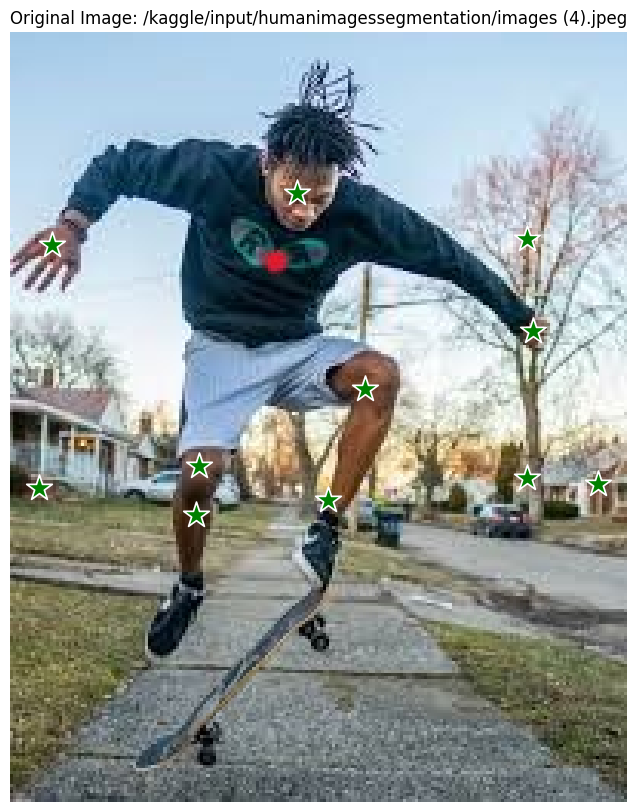

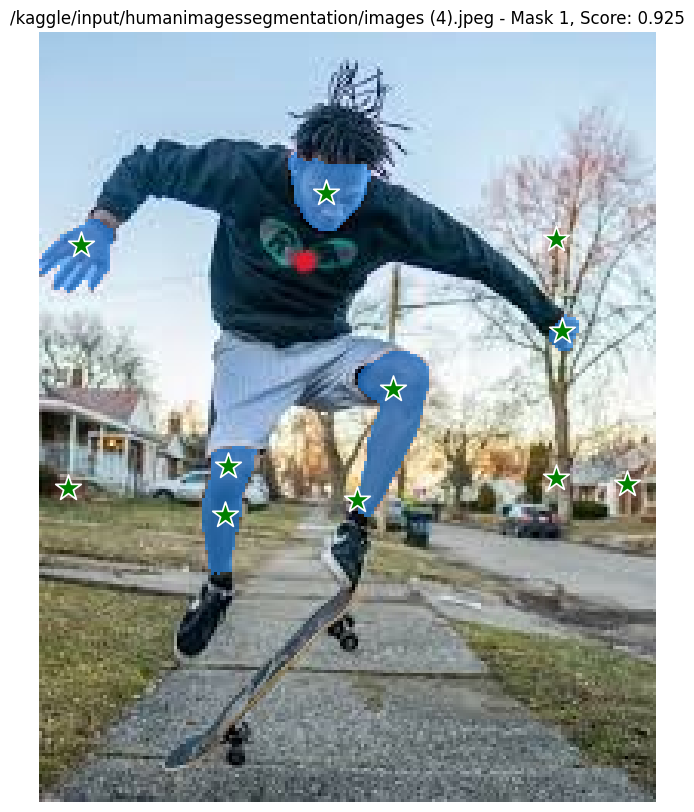

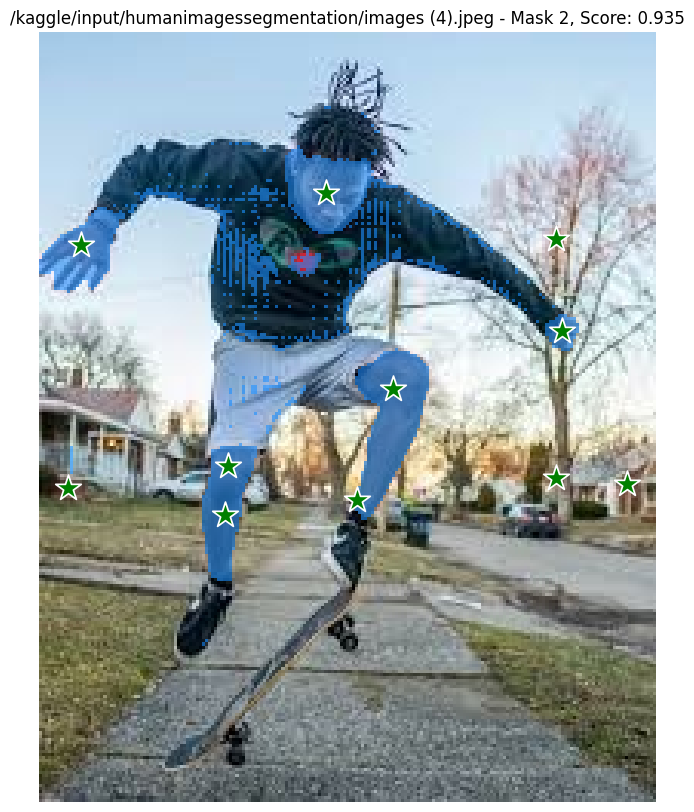

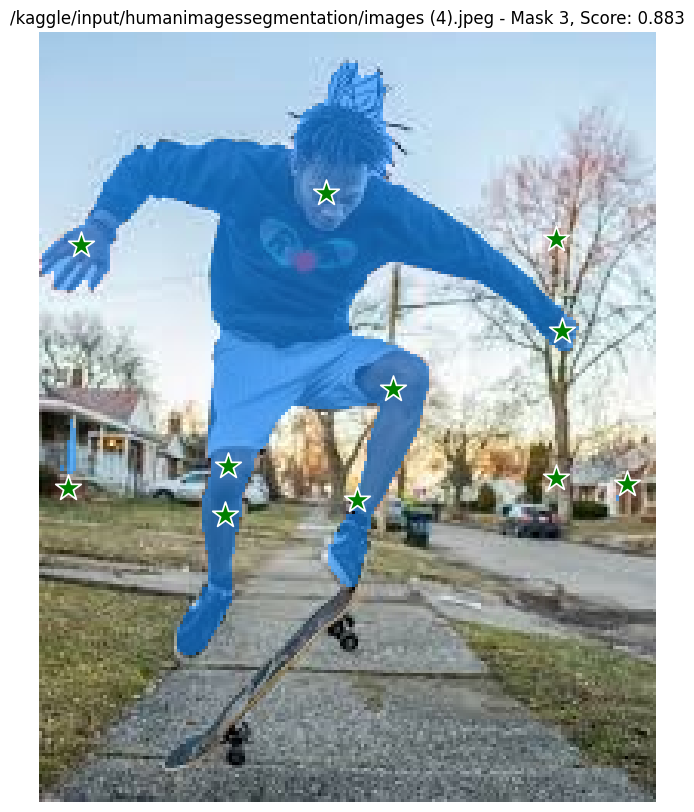

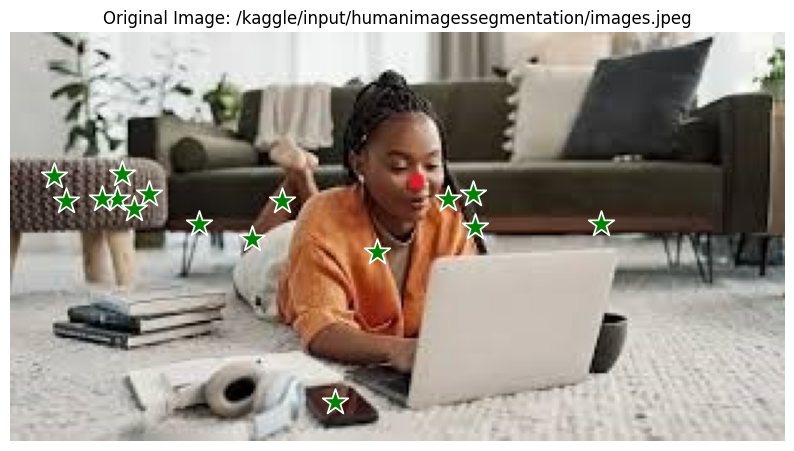

...

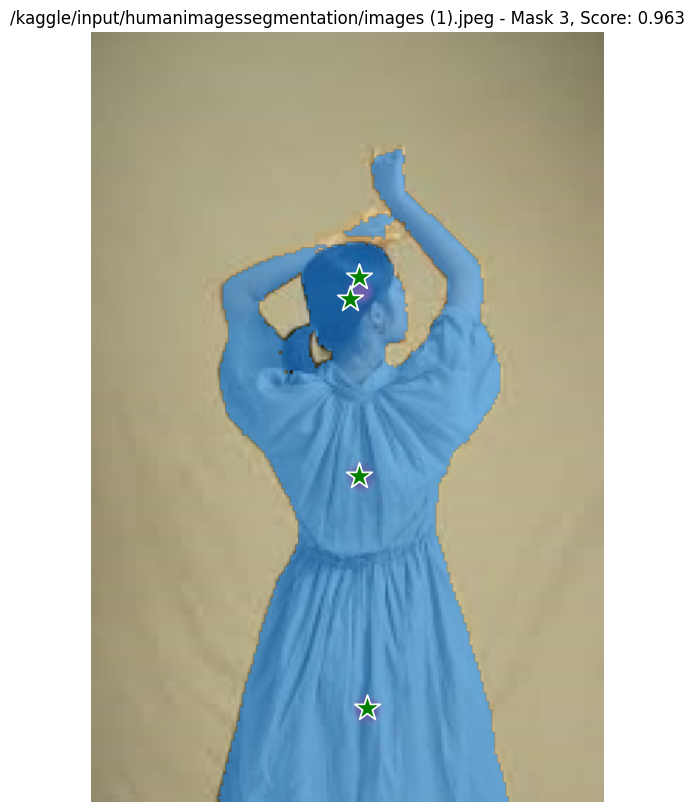

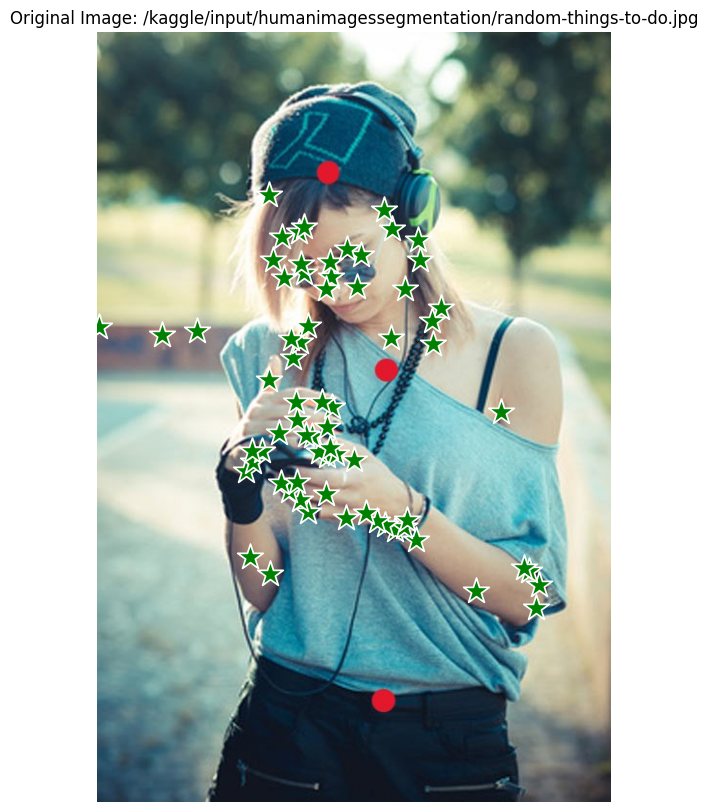

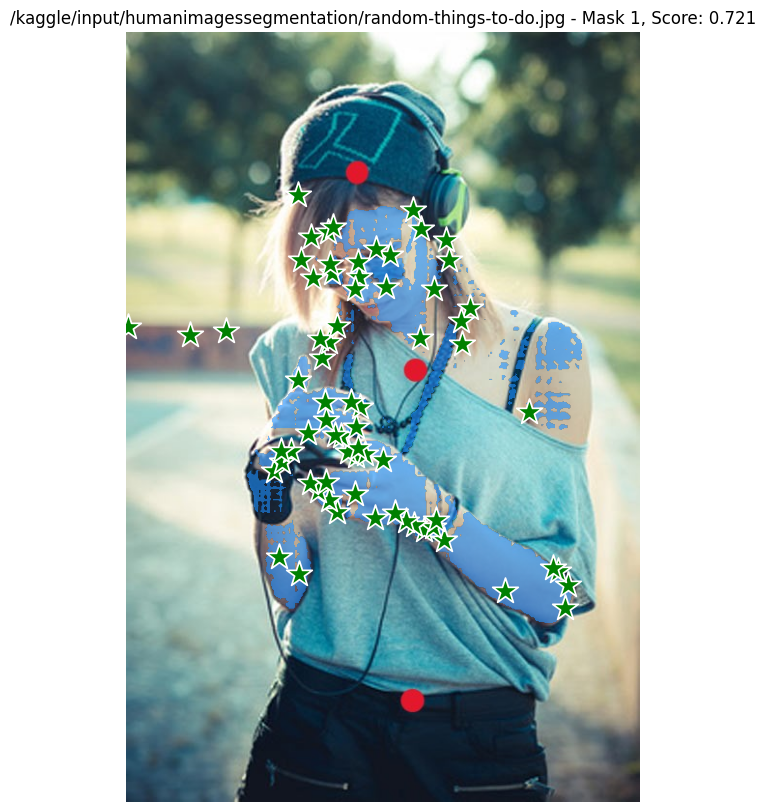

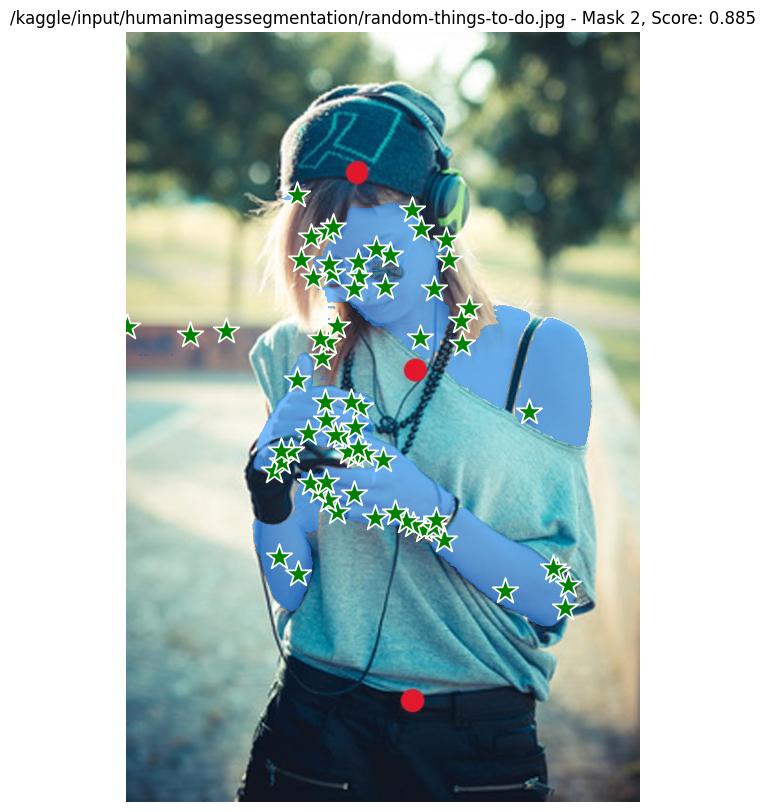

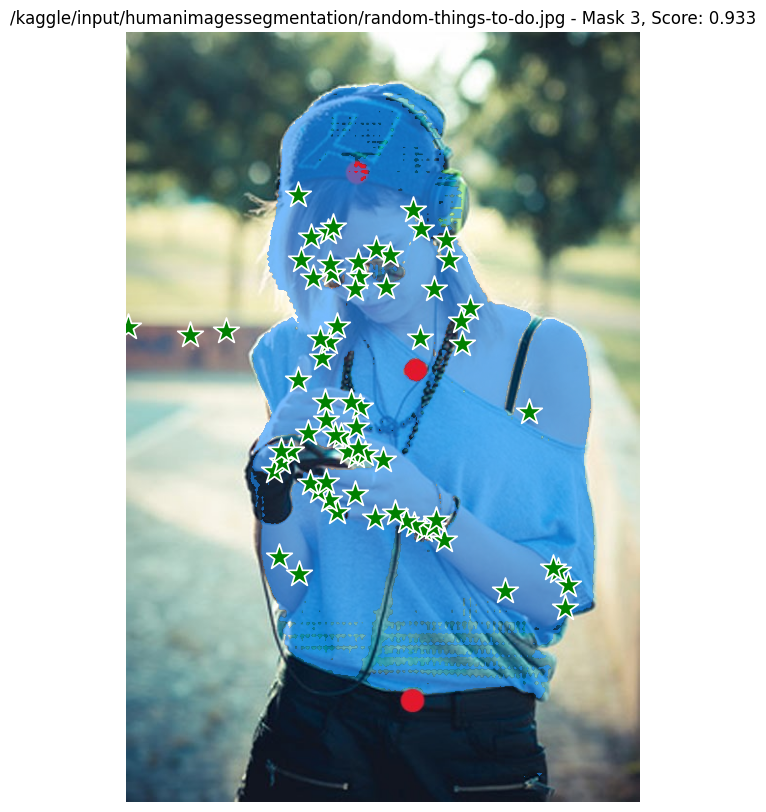

In [57]:

def detect_red_dots(image_path, lower_red=np.array([0,50,50]), upper_red=np.array([10,255,255])):
    
    img = cv2.imread(image_path) #read image
    hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV) #convert to HSV color space
    mask = cv2.inRange(hsv, lower_red, upper_red) #create maks for red region
    contours, _ = cv2.findContours(mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    
    #calculate middle point for contours and append center coordinates to point list
    points = []
    for contour in contours:
        M = cv2.moments(contour)
        if M["m00"] != 0:
            cX = int(M["m10"] / M["m00"])
            cY = int(M["m01"] / M["m00"])
            points.append([cX, cY])
    return points


def show_mask(mask, ax):
    color = np.array([30/255, 144/255, 255/255, 0.6]) #define color
    h, w = mask.shape[-2:]  #height and width of mask
    mask_image = mask.reshape(h, w, 1) * color.reshape(1, 1, -1)  #create mask
    ax.imshow(mask_image)

    #plot points used to mask as green starts on axis
def show_points(coords, labels, ax, marker_size=375):
    pos_points = coords[labels==1]
    ax.scatter(pos_points[:, 0], pos_points[:, 1], color='green', marker='*', s=marker_size, edgecolor='white', linewidth=1.25)

for image_file in image_files:
    image_path = os.path.join(image_dir, image_file)
    
    #find red dots in image
    points = detect_red_dots(image_path)

    #read image
    image = cv2.imread(image_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    
    predictor.set_image(image)

    #prepare input points for model
    input_points = np.array(points)
    input_labels = np.ones(len(points))  #array of ones for input labels

    #generate masks with SAM predictor
    masks, scores, _ = predictor.predict(
        point_coords=input_points,
        point_labels=input_labels,
        multimask_output=True
    )

    #display original img with input points
    plt.figure(figsize=(10, 10))
    plt.imshow(image)
    show_points(input_points, input_labels, plt.gca())
    plt.title(f"Original Image: {image_file}")
    plt.axis('off')
    plt.show()

    #display each generated mask
    for i, (mask, score) in enumerate(zip(masks, scores)):
        plt.figure(figsize=(10, 10))
        plt.imshow(image)
        show_mask(mask, plt.gca())
        show_points(input_points, input_labels, plt.gca())
        plt.title(f"{image_file} - Mask {i+1}, Score: {score:.3f}")
        plt.axis('off')
        plt.show()

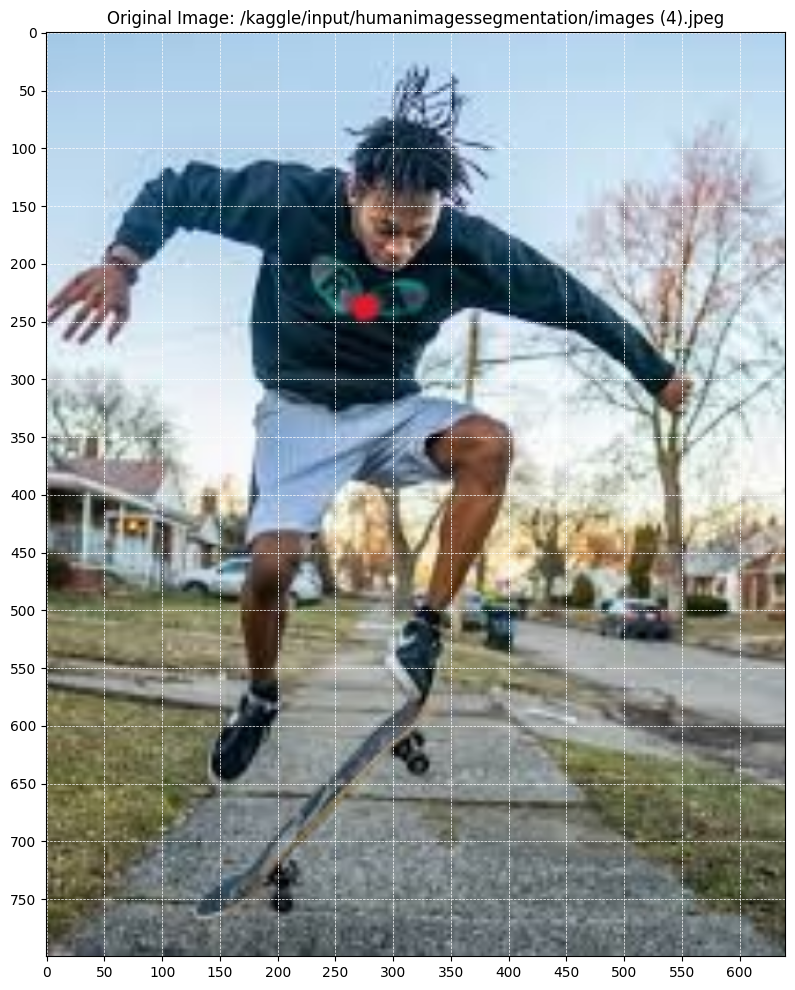

Enter coordinates as x1,y1 x2,y2 ... (or press enter to skip this image):  275,260


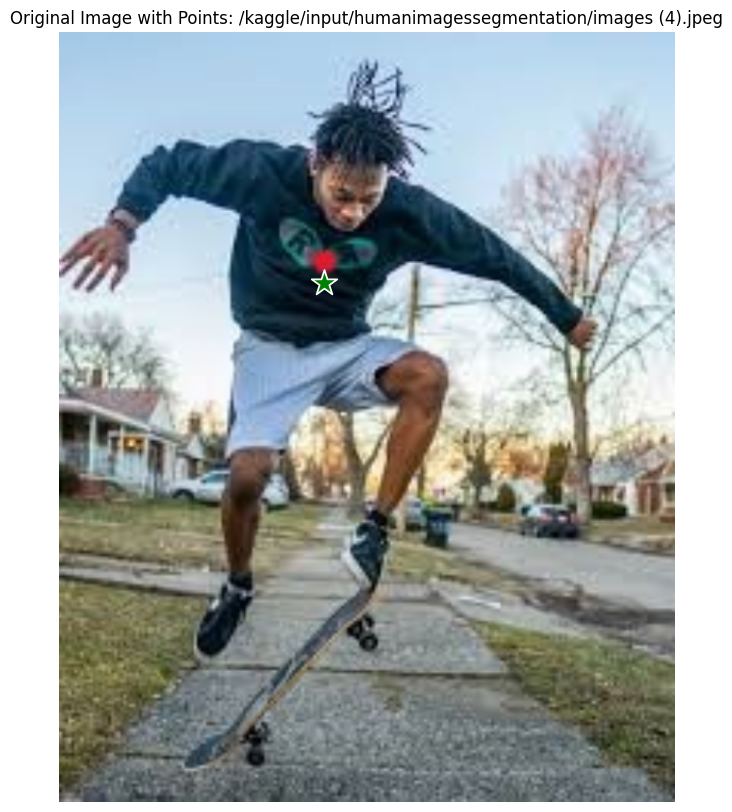

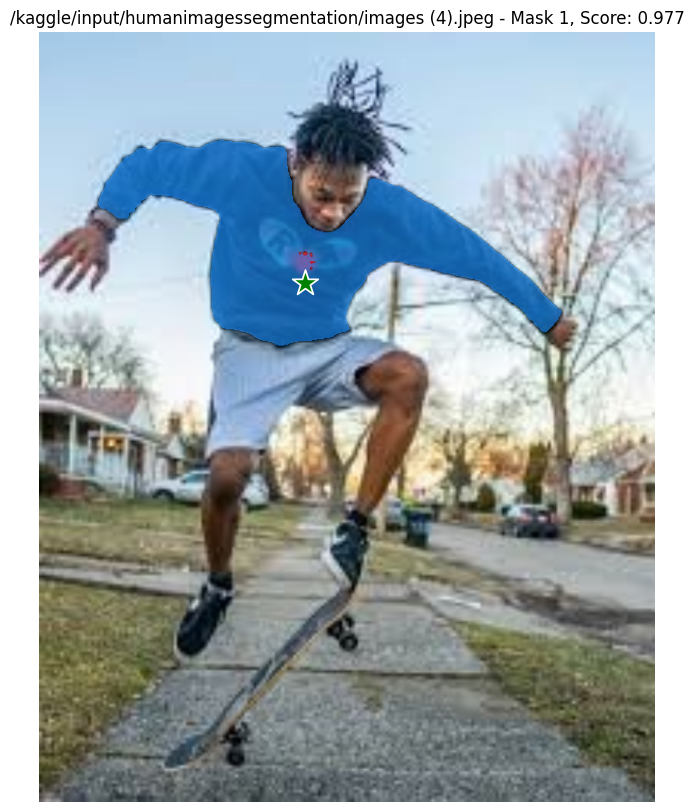

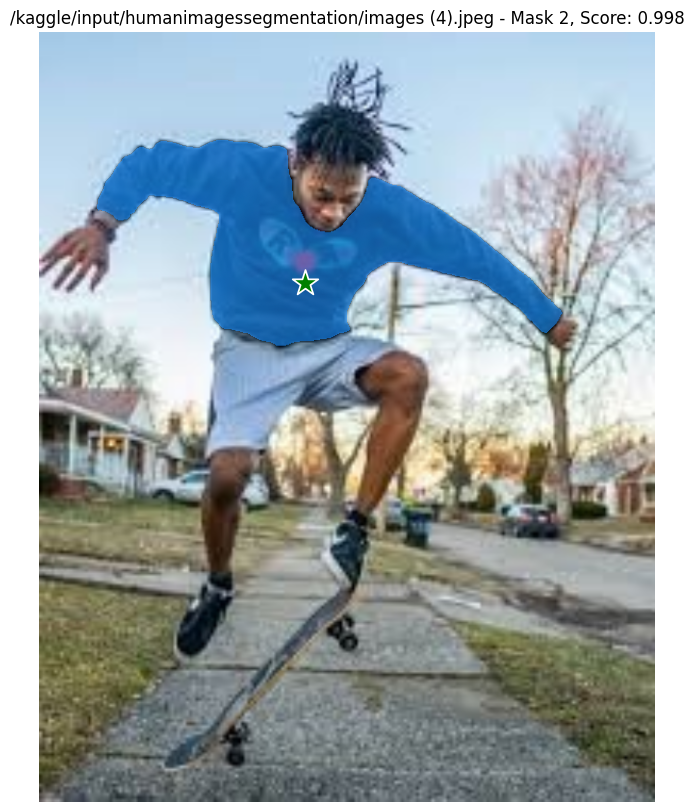

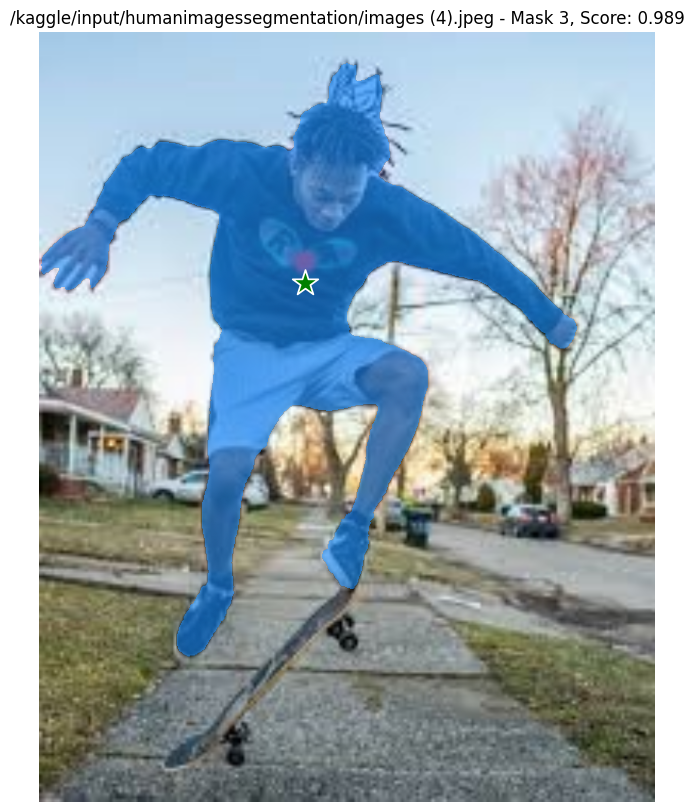

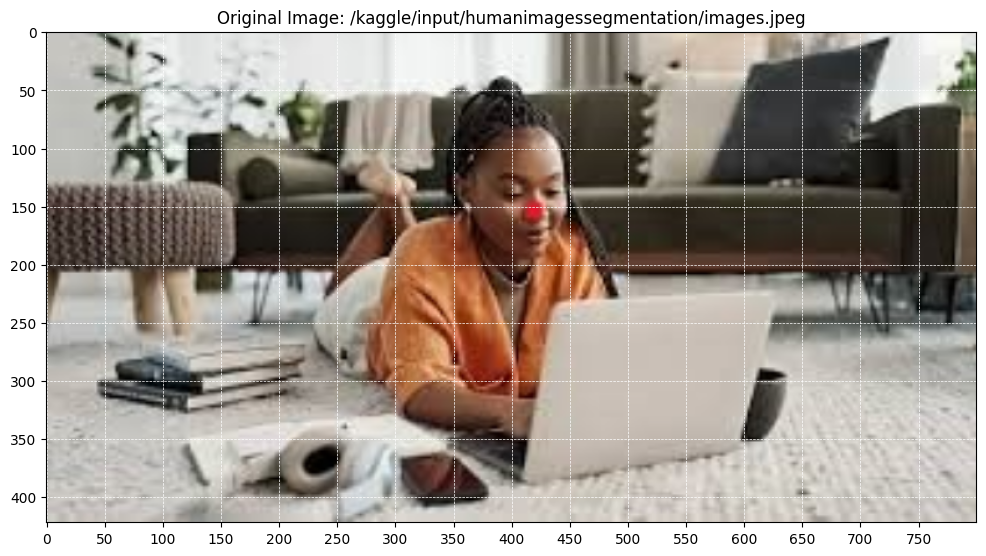

KeyboardInterrupt: Interrupted by user

In [58]:
def display_image_with_grid(image, image_file):
    fig, ax = plt.subplots(figsize=(12, 12))
    ax.imshow(image)
    ax.set_title(f"Original Image: {image_file}")
    
    #adds white grid
    ax.grid(color='w', linestyle='--', linewidth=0.5)
    
    #sets tick marks every 50 px
    height, width = image.shape[:2]
    ax.set_xticks(np.arange(0, width, 50))
    ax.set_yticks(np.arange(0, height, 50))
    
    #tick labels
    ax.set_xticklabels(np.arange(0, width, 50))
    ax.set_yticklabels(np.arange(0, height, 50))
    
    plt.show()


for image_file in image_files:
    image_path = os.path.join(image_dir, image_file)
    image = process_image(image_path)
    
    display_image_with_grid(image, image_file)
    
    #ask for user input
    coordinates_input = input("Enter coordinates as x1,y1 x2,y2 ... (or press enter to skip this image): ")
    
    #if enter skip image
    if coordinates_input.strip() == "":
        print(f"Skipping {image_file}")
        continue
    
    try:
        coordinates = [list(map(float, coord.split(','))) for coord in coordinates_input.split()]
        input_points = np.array(coordinates)
        
        #converts input str into list of coordinates
        if len(input_points) > 0:
            input_labels = np.ones(len(input_points))
            
            #set image
            predictor.set_image(image)
            
            #generate masks
            masks, scores, _ = predictor.predict(
                point_coords=input_points,
                point_labels=input_labels,
                multimask_output=True
            )
            
            #display
            plt.figure(figsize=(10, 10))
            plt.imshow(image)
            show_points(input_points, input_labels, plt.gca())
            plt.title(f"Original Image with Points: {image_file}")
            plt.axis('off')
            plt.show()
            
            for i, (mask, score) in enumerate(zip(masks, scores)):
                plt.figure(figsize=(10, 10))
                plt.imshow(image)
                show_mask(mask, plt.gca())
                show_points(input_points, input_labels, plt.gca())
                plt.title(f"{image_file} - Mask {i+1}, Score: {score:.3f}")
                plt.axis('off')
                plt.show()
        else:
            print(f"no valid points entered for {image_file}")
    except ValueError:
        print(f"invalid input for {image_file}. Skipping imagee")